# Autism Classification Using Resting-State fMRI Data 

### (Classifier)

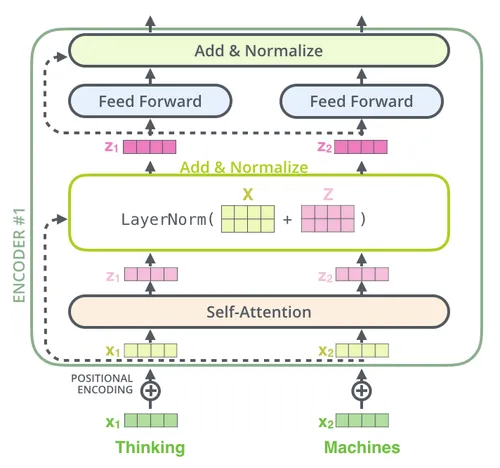

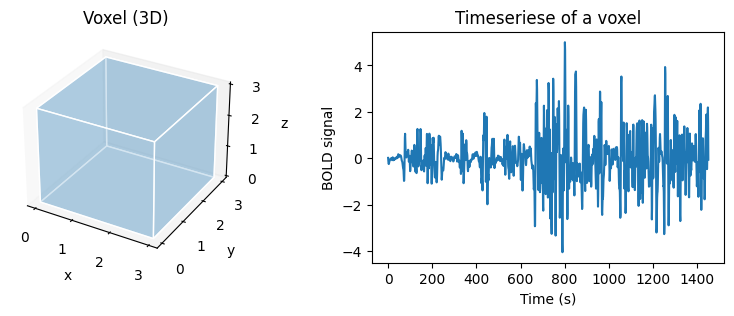
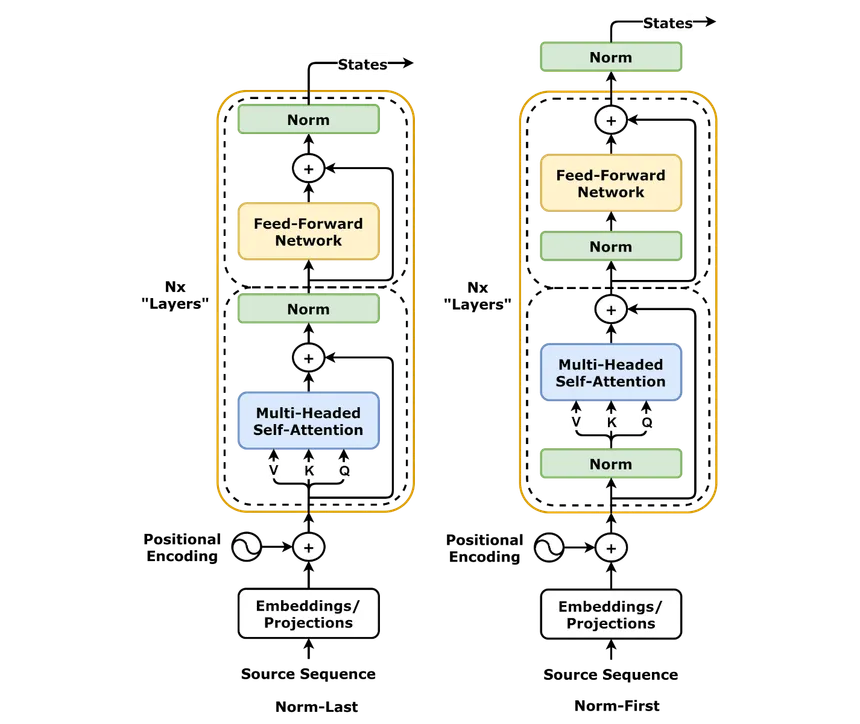
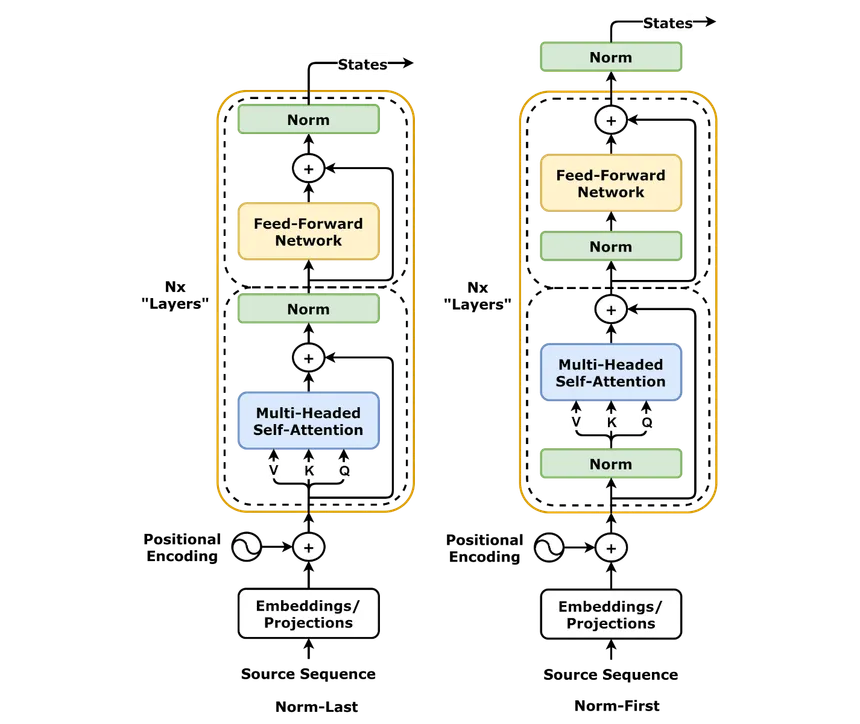
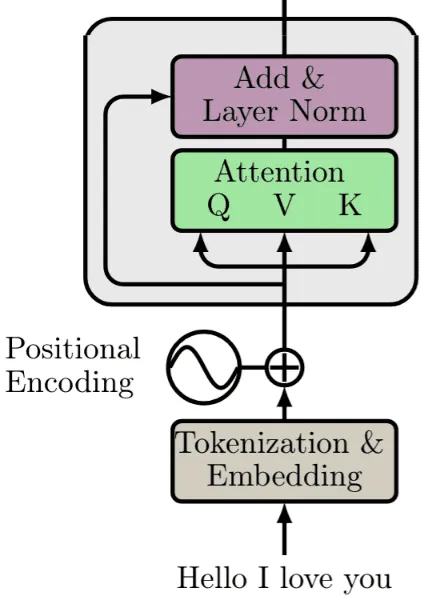
...
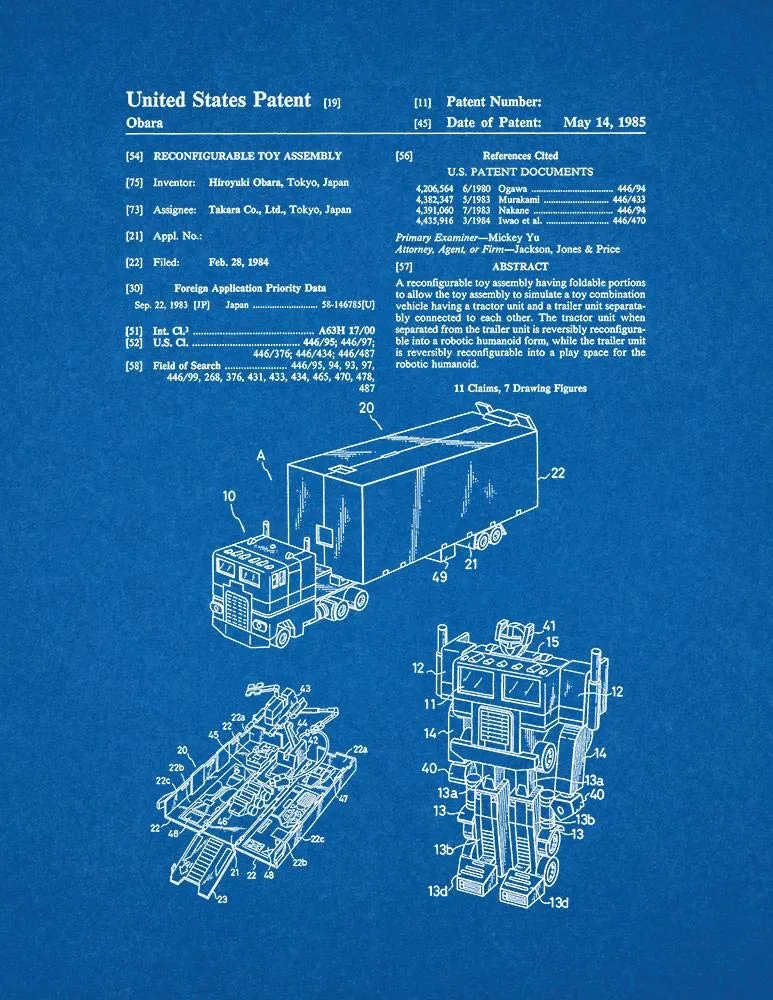
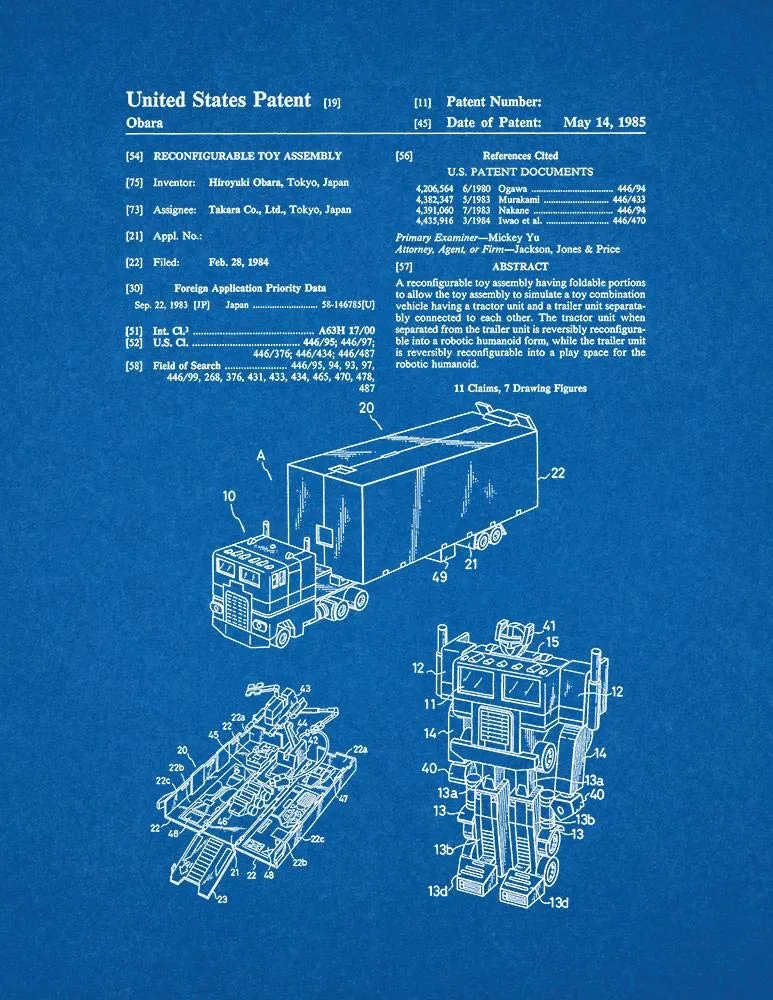
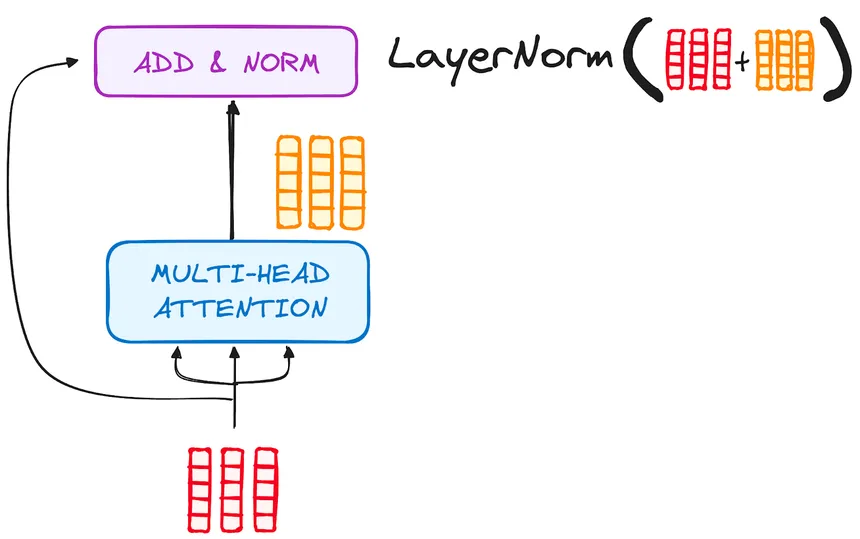
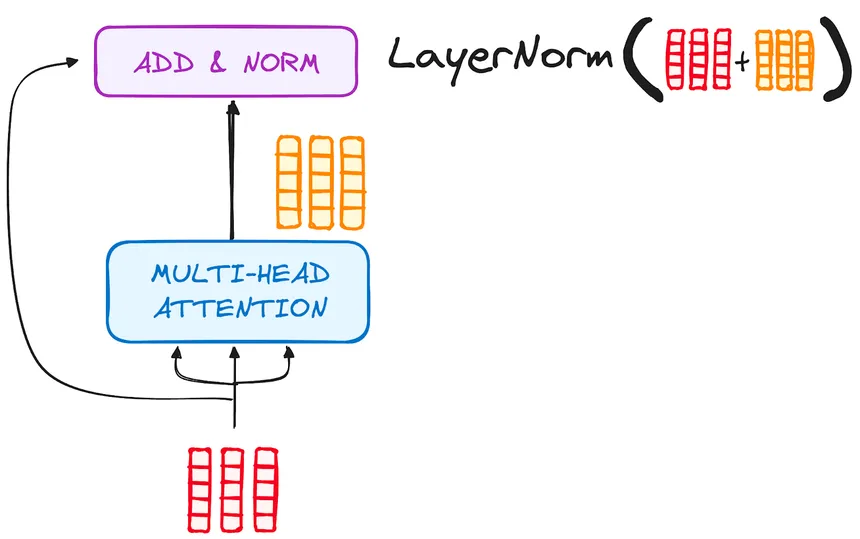
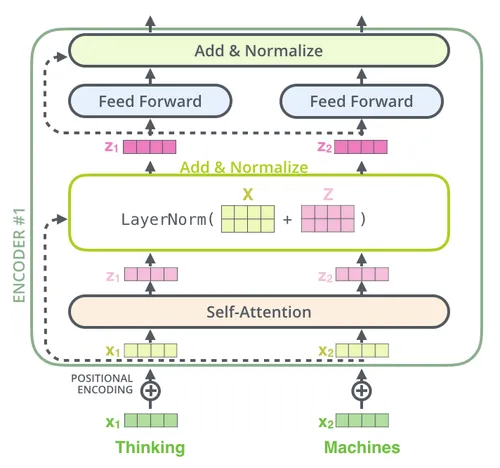

In [1]:
# Import necessary libraries

import os

import json

import numpy as np

import pandas as pd

import seaborn as sns

from glob import glob

from pathlib import Path

import matplotlib.pyplot as plt

import plotly.graph_objects as go

import matplotlib.patches as mpatches

from matplotlib import colormaps, colors

from nilearn import datasets, maskers, plotting

from nilearn.maskers import NiftiLabelsMasker

from nilearn.connectome import ConnectivityMeasure





# Ignore warnings for cleaner output

import warnings

warnings.filterwarnings('ignore')

In [2]:
pip install --quiet torch-geometric


Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install --quiet torch==2.4.0 torchvision


Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install --quiet optuna-integration

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install --quiet pytorch-ranger

Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install --quiet torch_optimizer

Note: you may need to restart the kernel to use updated packages.


In [7]:
# Import Torch libraries

import torch
import optuna
import torch.nn as nn
import torch.optim as optim
import torch_optimizer as optimizers
from torch.optim.lr_scheduler import CosineAnnealingLR
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score, confusion_matrix
from torch.utils.data import DataLoader, TensorDataset, random_split
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

## **Load and explore the data**

### Target Variable ( Y )

In [8]:
csv_path = '/kaggle/input/abide-dataset/autism_pheno.csv'



pheno = pd.read_csv(csv_path)

In [9]:
# Filter relevant columns
relevant_columns = ['DX_GROUP', 'DSM_IV_TR', 'AGE_AT_SCAN', 'SEX']
pheno = pheno[relevant_columns]


In [10]:
# Convert DX_GROUP to binary (1=Autism, 0=Control)
pheno['DX_GROUP'] = pheno['DX_GROUP'].apply(lambda x: 1 if x == 1 else 0)


# Convert SEX to binary (1=Male, 0=Female)
pheno['SEX'] = pheno['SEX'].apply(lambda x: 1 if x == 1 else 0)

# Standardize AGE_AT_SCAN
scaler = StandardScaler()
pheno['AGE'] = scaler.fit_transform(pheno[['AGE_AT_SCAN']])


In [11]:
print(pheno['DX_GROUP'].value_counts())
print(pheno['DSM_IV_TR'].value_counts())
print(pheno['SEX'].value_counts())

DX_GROUP
0    468
1    403
Name: count, dtype: int64
DSM_IV_TR
 0       456
 1       258
 2        74
-9999     53
 3        29
 4         1
Name: count, dtype: int64
SEX
1    727
0    144
Name: count, dtype: int64


In [12]:
pheno.describe()

,DX_GROUP,DSM_IV_TR,AGE_AT_SCAN,SEX,AGE
count,871.000000,871.000000,871.000000,871.000000,8.710000e+02
mean,0.462687,-607.864524,16.943665,0.834673,1.794712e-16
std,0.498892,2391.822037,7.580910,0.371689,1.000575e+00
min,0.000000,-9999.000000,6.470000,0.000000,-1.382378e+00
25%,0.000000,0.000000,11.920000,1.000000,-6.630538e-01
50%,0.000000,0.000000,14.750000,1.000000,-2.895332e-01
75%,1.000000,1.000000,19.779550,1.000000,3.742974e-01
max,1.000000,4.000000,58.000000,1.000000,5.418865e+00


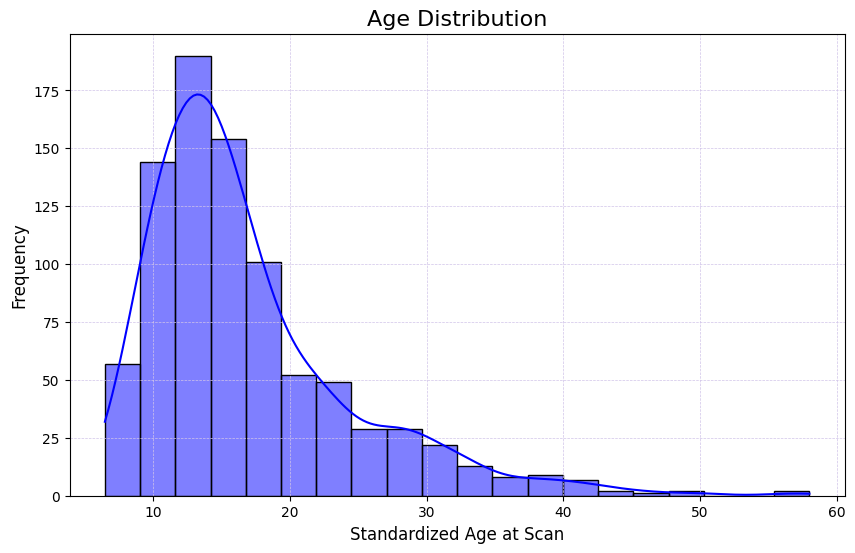

In [13]:
plt.figure(figsize=(10, 6))
sns.histplot(pheno['AGE_AT_SCAN'], kde=True, color = 'blue', bins=20)
plt.title('Age Distribution', fontsize=16)
plt.xlabel('Standardized Age at Scan', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(color="#d1c4e9", linestyle='--', linewidth=0.5)
plt.show()


In [14]:

# Convert DSM_IV_TR to a categorical variable
pheno['DSM_IV_TR'] = pheno['DSM_IV_TR'].astype('category')



In [15]:
pheno.head()

,DX_GROUP,DSM_IV_TR,AGE_AT_SCAN,SEX,AGE
0,1,1,24.45,1,0.990732
1,1,1,19.09,1,0.283286
2,1,1,13.73,0,-0.424159
3,1,1,13.37,1,-0.471674
4,1,1,17.78,1,0.110385


### Independent Variables ( x )

In [16]:
# Load the features 



feat_file = '/kaggle/input/abide-dataset/Autism_Classf_featuress.npz' 

X_features = np.load(feat_file)['a']



print('Features shape:', X_features.shape)

Features shape: (871, 2016)


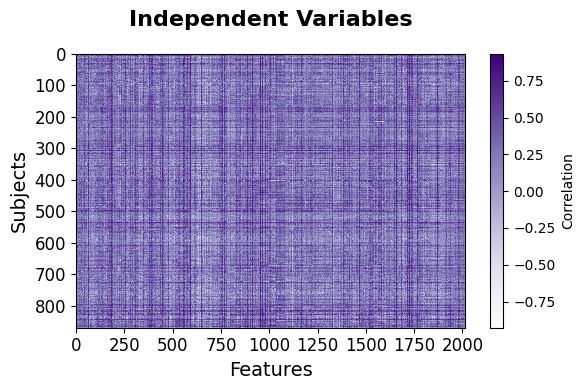

In [17]:
# Independent Variables



def plot_feature_matrix(X_features, title='Independent Variables', xlabel='Features', ylabel='Subjects'):



    plt.figure(figsize=(6, 4))  # Increased size for better visibility

    plt.imshow(X_features, aspect='auto', cmap='Purples', interpolation='nearest')  # Changed colormap to 'plasma'



    # Add colorbar

    cbar = plt.colorbar(label='Correlation')

    cbar.ax.tick_params(labelsize=10)  # Colorbar ticks



    # Add title and labels with enhanced aesthetics

    plt.title(title, fontsize=16, fontweight='bold', pad=20)  # Larger, bold title

    plt.xlabel(xlabel, fontsize=14)

    plt.ylabel(ylabel, fontsize=14)



    # Improve ticks

    plt.xticks(fontsize=12)

    plt.yticks(fontsize=12)



    # Add gridlines for better readability

    plt.grid(False)  # Set to True for actual gridlines, adjust as necessary



    # Tight layout

    plt.tight_layout()

    plt.show()





plot_feature_matrix(X_features)

In [18]:
# Convert feature vectors to symmetric correlation matrices

def vector_to_symmetric_matrix(vector, size=64):

    full_matrix = np.zeros((size, size))

    full_matrix[np.triu_indices(size, k=1)] = vector

    return full_matrix + full_matrix.T



reshaped_features = np.array([vector_to_symmetric_matrix(f) for f in X_features])

In [19]:
reshaped_features.shape

(871, 64, 64)

## Preprocess Data

In [20]:
# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# --- Dataset Creation ---

# Convert AGE_AT_SCAN, SEX, and DX_GROUP to PyTorch tensors
age_data = torch.tensor(pheno['AGE'].values, dtype=torch.float32)
sex_data = torch.tensor(pheno['SEX'].values, dtype=torch.float32)
labels = torch.tensor(pheno['DX_GROUP'].values, dtype=torch.float32)

# Convert ROI features (fMRI connectivity) to a PyTorch tensor
roi_features = torch.tensor(X_features, dtype=torch.float32)  # Assuming X_features is preprocessed

# Create a PyTorch dataset combining all features
dataset = TensorDataset(roi_features, age_data, sex_data, labels)

# Split the dataset into training and testing sets
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_data, test_data = random_split(dataset, [train_size, test_size])

# Create DataLoaders for batching
batch_size = 32
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)


Using device: cuda


# **Transformer Model**

(**Multi-Head Attention**)



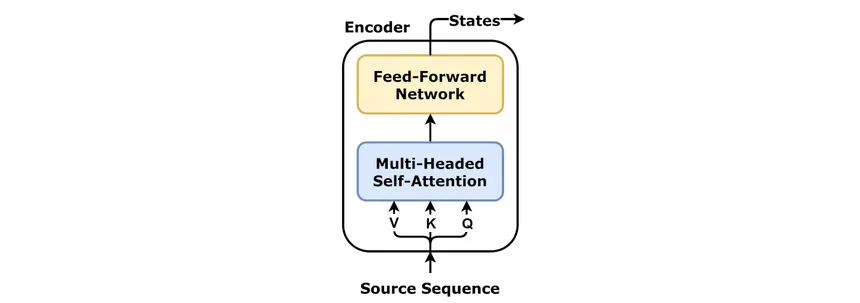
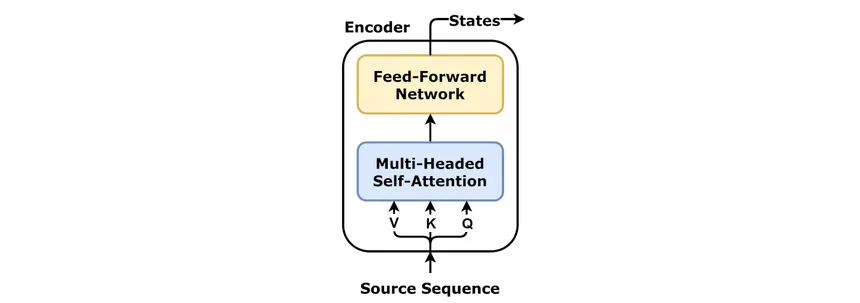
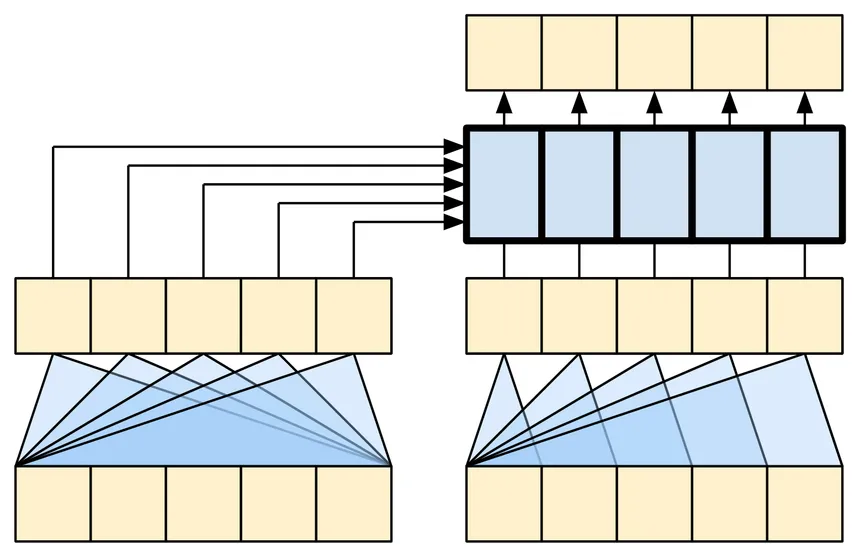
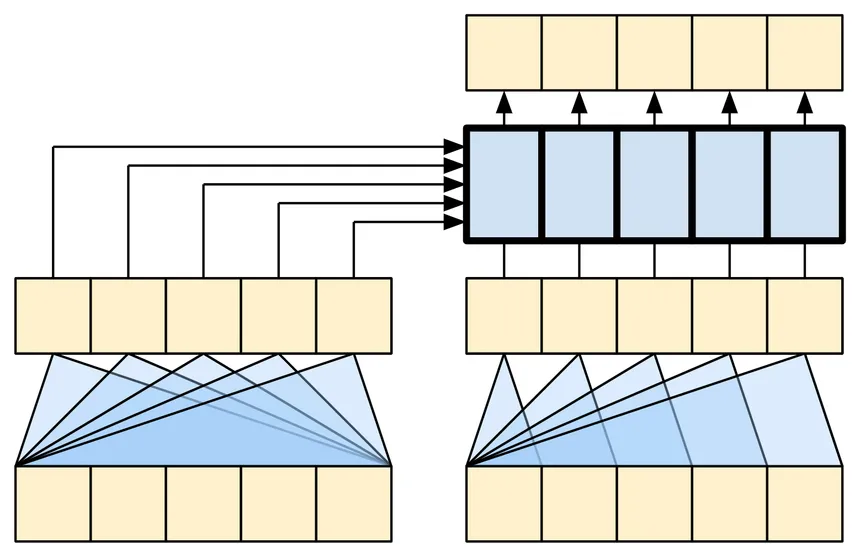
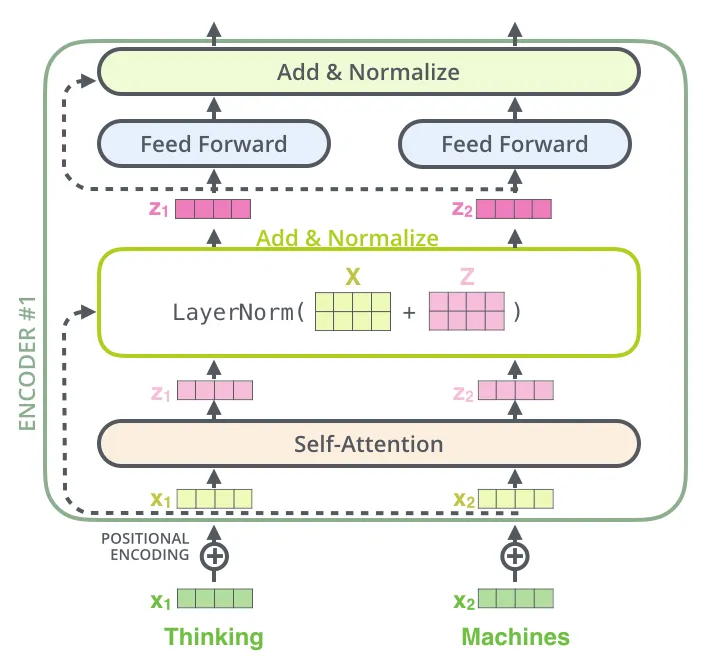
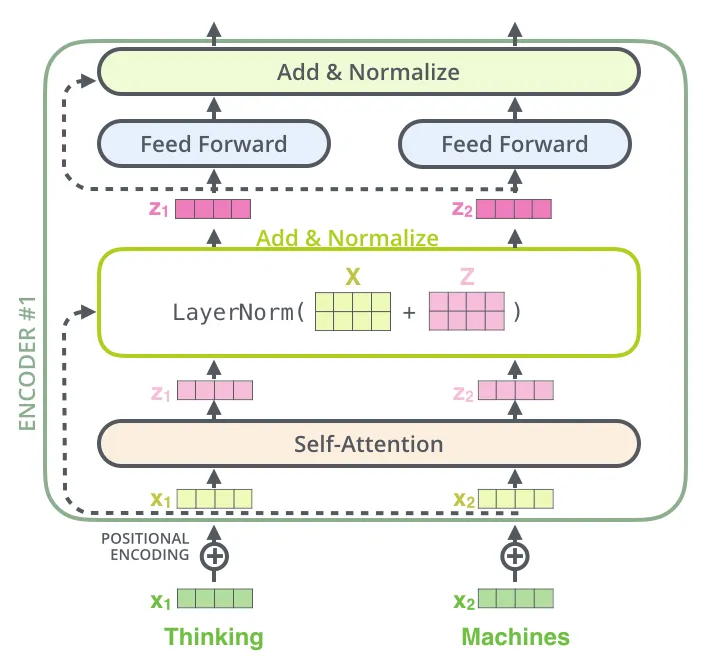
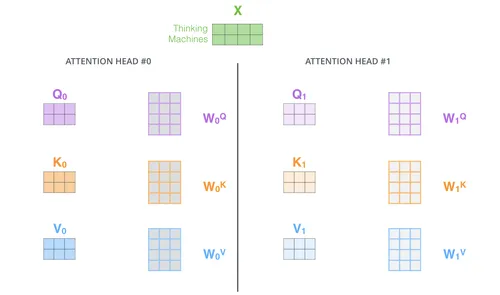
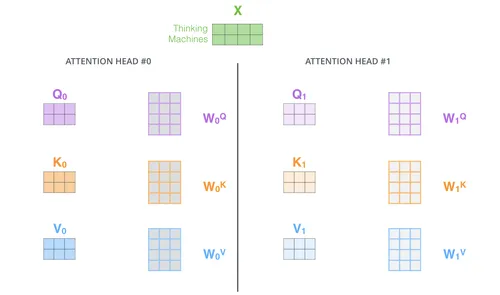

## Create the Model

In [21]:
class CrossAttentionTransformer(nn.Module):
    def __init__(self, roi_input_dim, embed_dim, num_heads, num_layers, dropout_rate):
        super(CrossAttentionTransformer, self).__init__()

        # Ensure embed_dim is divisible by num_heads
        if embed_dim % num_heads != 0:
            embed_dim = (embed_dim // num_heads) * num_heads
            print(f"Adjusted embed_dim to {embed_dim} to ensure divisibility by num_heads.")

        # === Age Encoder ===
        self.age_mlp = nn.Sequential(
            nn.Linear(1, embed_dim),
            nn.GELU(),
            nn.Dropout(dropout_rate),
            nn.Linear(embed_dim, embed_dim)
        )

        # === Gender Encoder ===
        self.gender_embed = nn.Embedding(2, embed_dim)

        # === ROI Encoder ===
        self.roi_encoder = nn.Sequential(
            nn.Linear(roi_input_dim, embed_dim),
            nn.GELU(),
            nn.LayerNorm(embed_dim),
            nn.Dropout(dropout_rate),
            nn.Linear(embed_dim, embed_dim)
        )

        # === Cross-Attention ===
        self.cross_attention = nn.MultiheadAttention(embed_dim, num_heads, dropout=dropout_rate)

        # === Transformer Encoder ===
        self.transformer_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim, nhead=num_heads, dim_feedforward=embed_dim * 4, dropout=dropout_rate
        )
        self.transformer_encoder = nn.TransformerEncoder(self.transformer_layer, num_layers=num_layers)

        # === Output Layer ===
        self.output_layer = nn.Linear(embed_dim, 1)
        nn.init.xavier_uniform_(self.output_layer.weight)
        nn.init.zeros_(self.output_layer.bias)

    def forward(self, roi_data, age, gender):
        # === Feature Encoding ===
        age_embed = self.age_mlp(age.unsqueeze(-1))  # Shape: (batch_size, embed_dim)
        gender_embed = self.gender_embed(gender.long())  # Shape: (batch_size, embed_dim)
        roi_encoded = self.roi_encoder(roi_data)  # Shape: (batch_size, embed_dim)

        # === Cross-Attention ===
        contextual_features = torch.stack((age_embed, gender_embed), dim=1)  # (batch_size, seq_len=2, embed_dim)
        contextual_features = contextual_features.permute(1, 0, 2)  # (seq_len, batch_size, embed_dim)
        roi_encoded = roi_encoded.unsqueeze(1).permute(1, 0, 2)  # (1, batch_size, embed_dim)

        attended_features, _ = self.cross_attention(roi_encoded, contextual_features, contextual_features)
        attended_features = attended_features.squeeze(0)  # (batch_size, embed_dim)

        # === Transformer Encoder ===
        transformer_input = torch.cat((attended_features.unsqueeze(1), contextual_features.permute(1, 0, 2)), dim=1)
        transformer_output = self.transformer_encoder(transformer_input.permute(1, 0, 2))  # (seq_len, batch_size, embed_dim)

        # === Output ===
        pooled_output = transformer_output.mean(dim=0)  # Mean pooling across sequence length
        output = self.output_layer(pooled_output).squeeze(1)  # Shape: (batch_size,)
        return output


In [22]:

# --- Improved Hyperparameter Optimization with Optuna ---
def objective(trial):
    # Hyperparameter suggestions
    embed_dim = trial.suggest_int("embed_dim", 64, 256, step=16)
    num_heads = trial.suggest_int("num_heads", 2, 8)
    num_layers = trial.suggest_int("num_layers", 1, 4)
    dropout_rate = trial.suggest_float("dropout_rate", 0.01, 0.2)
    lr = trial.suggest_loguniform("lr", 1e-5, 1e-3)

    # Ensure embed_dim is divisible by num_heads
    if embed_dim % num_heads != 0:
        embed_dim = (embed_dim // num_heads) * num_heads
        print(f"Adjusted embed_dim to {embed_dim} to ensure divisibility by num_heads.")
        
    # Instantiate model
    model = CrossAttentionTransformer(
        roi_input_dim=roi_features.shape[1],
        embed_dim=embed_dim,
        num_heads=num_heads,
        num_layers=num_layers,
        dropout_rate=dropout_rate
    ).to(device)

    # Define loss and optimizer
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optimizers.Ranger(model.parameters(), lr=lr, weight_decay=1e-5)
    scheduler = CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-6)

    # Early stopping settings
    best_val_loss = float("inf")
    patience = 20
    counter = 0

    # Training loop
    for epoch in range(1000):  # Limited epochs for efficiency
        model.train()
        train_loss = 0
        for roi_data, age, gender, y in train_loader:
            roi_data, age, gender, y = roi_data.to(device), age.to(device), gender.to(device), y.to(device)

            optimizer.zero_grad()
            outputs = model(roi_data, age, gender)
            loss = criterion(outputs, y)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        # Validation loop
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for roi_data, age, gender, y in test_loader:
                roi_data, age, gender, y = roi_data.to(device), age.to(device), gender.to(device), y.to(device)
                outputs = model(roi_data, age, gender)
                loss = criterion(outputs, y)
                val_loss += loss.item()

        val_loss /= len(test_loader)
        scheduler.step()

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            counter = 0
        else:
            counter += 1
            if counter >= patience:
                break

    return best_val_loss


# Suppress Optuna output during optimization
optuna.logging.set_verbosity(optuna.logging.WARNING)

# Run Optuna study
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=300)
print("Best hyperparameters:", study.best_params)


Adjusted embed_dim to 238 to ensure divisibility by num_heads.
Adjusted embed_dim to 63 to ensure divisibility by num_heads.
Adjusted embed_dim to 174 to ensure divisibility by num_heads.
Adjusted embed_dim to 126 to ensure divisibility by num_heads.
Adjusted embed_dim to 78 to ensure divisibility by num_heads.
Adjusted embed_dim to 252 to ensure divisibility by num_heads.
Adjusted embed_dim to 252 to ensure divisibility by num_heads.
Adjusted embed_dim to 222 to ensure divisibility by num_heads.
Adjusted embed_dim to 255 to ensure divisibility by num_heads.
Adjusted embed_dim to 203 to ensure divisibility by num_heads.
Adjusted embed_dim to 238 to ensure divisibility by num_heads.
Adjusted embed_dim to 252 to ensure divisibility by num_heads.
Adjusted embed_dim to 238 to ensure divisibility by num_heads.
Adjusted embed_dim to 252 to ensure divisibility by num_heads.
Adjusted embed_dim to 204 to ensure divisibility by num_heads.
Adjusted embed_dim to 220 to ensure divisibility by num_h

## Retraining Model with Best Hyperparameters

In [23]:
# Load the best hyperparameters from the Optuna study
best_params = study.best_params

# Initialize the model with the best hyperparameters
model = CrossAttentionTransformer(
    roi_input_dim=roi_features.shape[1],
    embed_dim=best_params["embed_dim"],
    num_heads=best_params["num_heads"],
    num_layers=best_params["num_layers"],
    dropout_rate=best_params["dropout_rate"]
).to(device)

# Define loss function and optimizer
criterion = nn.BCEWithLogitsLoss()  # Binary classification loss
optimizer = optimizers.Ranger(model.parameters(), lr=best_params["lr"], weight_decay=1e-5)
scheduler = CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-6)

# Training loop parameters
num_epochs = 1000
patience = 20  # Early stopping patience
best_val_loss = float("inf")  # Best validation loss tracker
counter = 0  # Early stopping counter

# Full training loop
for epoch in range(num_epochs):
    # === Training Phase ===
    model.train()  # Set model to training mode
    train_loss = 0
    for roi_data, age, gender, y in train_loader:
        roi_data, age, gender, y = roi_data.to(device), age.to(device), gender.to(device), y.to(device)

        optimizer.zero_grad()  # Clear gradients
        outputs = model(roi_data, age, gender)  # Forward pass
        loss = criterion(outputs, y)  # Compute loss
        loss.backward()  # Backpropagation
        optimizer.step()  # Update model parameters
        train_loss += loss.item()  # Accumulate training loss

    train_loss /= len(train_loader)  # Average training loss

    # === Validation Phase ===
    model.eval()  # Set model to evaluation mode
    val_loss = 0
    val_labels, val_outputs = [], []
    with torch.no_grad():  # Disable gradient calculations for validation
        for roi_data, age, gender, y in test_loader:
            roi_data, age, gender, y = roi_data.to(device), age.to(device), gender.to(device), y.to(device)

            outputs = model(roi_data, age, gender)  # Forward pass
            loss = criterion(outputs, y)  # Compute loss
            val_loss += loss.item()  # Accumulate validation loss

            # Collect predictions for metrics
            val_labels.extend(y.cpu().numpy())
            val_outputs.extend(torch.sigmoid(outputs).cpu().numpy())  # Convert logits to probabilities

    val_loss /= len(test_loader)  # Average validation loss

    # Compute validation metrics
    val_predicted = (np.array(val_outputs) >= 0.5).astype(int)
    val_accuracy = accuracy_score(val_labels, val_predicted)
    val_f1 = f1_score(val_labels, val_predicted)

    # Print progress
    print(f"Epoch {epoch+1}/{num_epochs}, "
          f"Train Loss: {train_loss:.4f}, "
          f"Val Loss: {val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.4f}, "
          f"Val F1 Score: {val_f1:.4f}")

    # Update learning rate scheduler
    scheduler.step(val_loss)

    # Early stopping check
    if val_loss < best_val_loss:
        best_val_loss = val_loss  # Update best validation loss
        counter = 0  # Reset patience counter
        # Save the best model
        torch.save(model.state_dict(), "best_model.pth")
        print("Best model saved!")
    else:
        counter += 1  # Increment patience counter
        if counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

# === Final Model Loading ===
#print("Loading the best model...")
#model.load_state_dict(torch.load("best_model.pth"))


Adjusted embed_dim to 252 to ensure divisibility by num_heads.
Epoch 1/1000, Train Loss: 0.8709, Val Loss: 0.8389, Val Accuracy: 0.4743, Val F1 Score: 0.6434
Best model saved!
Epoch 2/1000, Train Loss: 0.8220, Val Loss: 0.7678, Val Accuracy: 0.4857, Val F1 Score: 0.6457
Best model saved!
Epoch 3/1000, Train Loss: 0.7533, Val Loss: 0.7160, Val Accuracy: 0.4914, Val F1 Score: 0.6426
Best model saved!
Epoch 4/1000, Train Loss: 0.7216, Val Loss: 0.6884, Val Accuracy: 0.5600, Val F1 Score: 0.6316
Best model saved!
Epoch 5/1000, Train Loss: 0.6983, Val Loss: 0.6884, Val Accuracy: 0.5371, Val F1 Score: 0.1099
Best model saved!
Epoch 6/1000, Train Loss: 0.7074, Val Loss: 0.6901, Val Accuracy: 0.5200, Val F1 Score: 0.0000
Epoch 7/1000, Train Loss: 0.7000, Val Loss: 0.6910, Val Accuracy: 0.5257, Val F1 Score: 0.0235
Epoch 8/1000, Train Loss: 0.6909, Val Loss: 0.6914, Val Accuracy: 0.5314, Val F1 Score: 0.0465
Epoch 9/1000, Train Loss: 0.6989, Val Loss: 0.6923, Val Accuracy: 0.5257, Val F1 Score:

## Evaluate the Model

In [24]:
# Load the best model
model.load_state_dict(torch.load("best_model.pth"))
model.eval()

# Initialize lists to store predictions and ground truth labels
test_labels, test_preds, test_probs = [], [], []

# Evaluate the model
with torch.no_grad():
    for roi_data, age, gender, y in test_loader:
        # Move data to the device
        roi_data, age, gender, y = roi_data.to(device), age.to(device), gender.to(device), y.to(device)

        # Get model predictions
        outputs = model(roi_data, age, gender)  # Logits
        probs = torch.sigmoid(outputs)              # Probabilities
        preds = (probs >= 0.5).float()              # Apply threshold for binary classification

        # Store predictions and labels
        test_labels.extend(y.cpu().numpy())
        test_preds.extend(preds.cpu().numpy())
        test_probs.extend(probs.cpu().numpy())

# Convert to numpy arrays
test_labels = np.array(test_labels)
test_preds = np.array(test_preds)
test_probs = np.array(test_probs)

# Compute metrics
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(test_labels, test_preds)
roc_auc = roc_auc_score(test_labels, test_probs)  # Use probabilities for AUC
precision = precision_score(test_labels, test_preds)
recall = recall_score(test_labels, test_preds)
f1 = f1_score(test_labels, test_preds)

# Print metrics
print(f"Test Results:\n"
      f"Accuracy: {accuracy:.4f}\n"
      f"AUC-ROC: {roc_auc:.4f}\n"
      f"Precision: {precision:.4f}\n"
      f"Recall: {recall:.4f}\n"
      f"F1 Score: {f1:.4f}")


Test Results:
Accuracy: 0.5371
AUC-ROC: 0.5917
Precision: 0.7143
Recall: 0.0595
F1 Score: 0.1099


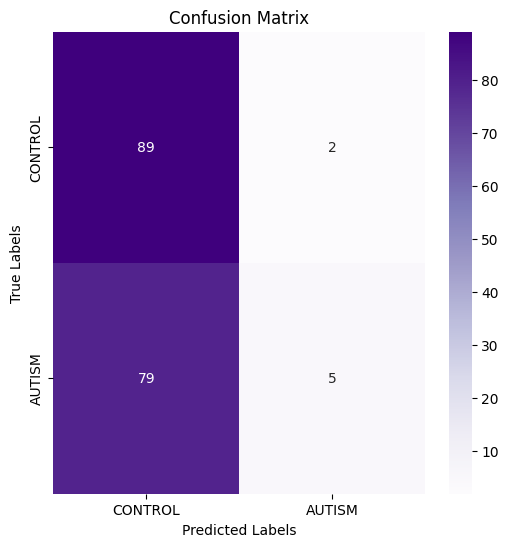

In [25]:
# Confusion Matrix


conf_matrix = confusion_matrix(test_labels, test_preds)

# Plot Confusion Matrix

plt.figure(figsize=(6, 6))

sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Purples", xticklabels=['CONTROL', 'AUTISM'], 

            yticklabels=['CONTROL', 'AUTISM'])

plt.title('Confusion Matrix')

plt.ylabel('True Labels')

plt.xlabel('Predicted Labels')

plt.show()

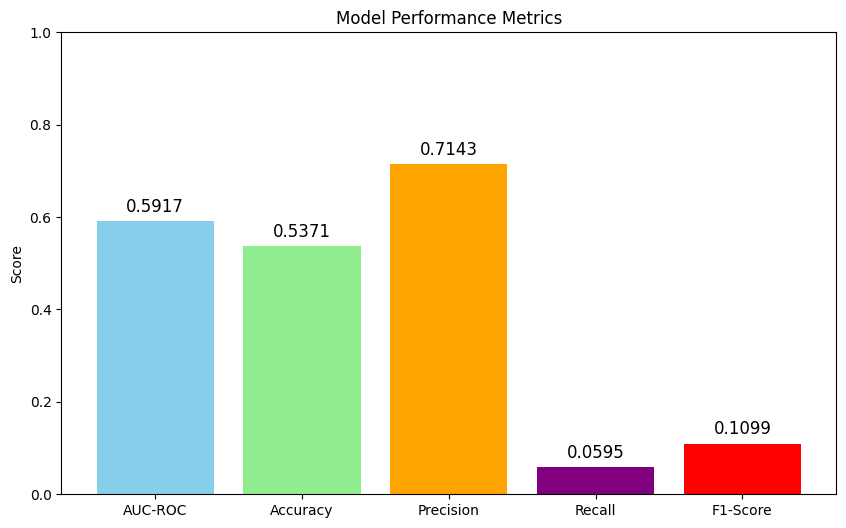

In [26]:
metrics = {'AUC-ROC': roc_auc, 'Accuracy': accuracy, 'Precision': precision, 'Recall': recall, 'F1-Score': f1}

metric_names = list(metrics.keys())

metric_values = list(metrics.values())



plt.figure(figsize=(10, 6))

plt.bar(metric_names, metric_values, color=['skyblue', 'lightgreen', 'orange', 'purple', 'red'])

plt.title("Model Performance Metrics")

plt.ylabel("Score")

plt.ylim(0, 1)  # As all scores are in [0, 1]

for i, v in enumerate(metric_values):

    plt.text(i, v + 0.02, f"{v:.4f}", ha='center', fontsize=12)

plt.show()

 ## **Probabilistic Atlas**


In [27]:
dim = 64

difumo = datasets.fetch_atlas_difumo(

    dimension=dim, resolution_mm=2, legacy_format=False

)



atlas_filename = difumo.maps



Added README.md to /root/nilearn_data


Dataset created in /root/nilearn_data/difumo_atlases



 ...done. (1 seconds, 0 min)
Extracting data from /root/nilearn_data/difumo_atlases/0fd53859aa9fed124e741c85ec45c705/download..... done.


 ...done. (1 seconds, 0 min)


In [28]:
# Label mapping for the Atlas

labels = difumo.labels["difumo_names"]

feature_names = [f'{labels[i]} - {labels[j]}' for i in range(dim) for j in range(i + 1, dim)]

feature_indices = list(range(1, len(feature_names) + 1))



# Create a DataFrame

feature_mapping_df = pd.DataFrame({

    'Feature Index': feature_indices,

    'Feature Name': feature_names

})



# Display a sample of the feature mapping DataFrame

print(feature_mapping_df.head(5))


   Feature Index                                       Feature Name
0              1           Superior frontal sulcus - Fusiform gyrus
1              2  Superior frontal sulcus - Calcarine cortex pos...
2              3  Superior frontal sulcus - Cingulate cortex pos...
3              4  Superior frontal sulcus - Parieto-occipital su...
4              5   Superior frontal sulcus - Insula antero-superior


### **Label mapping for the Atlas**

In [29]:
import pandas as pd



# Assuming labels is defined somewhere as difumo.labels["difumo_names"]



# Generate feature names and indices

labels = difumo.labels["difumo_names"]

feature_names = [f'{labels[i]} - {labels[j]}' for i in range(dim) for j in range(i + 1, dim)]

feature_indices = list(range(1, len(feature_names) + 1))



# Create a DataFrame

feature_mapping_df = pd.DataFrame({

    'Feature Index': feature_indices,

    'Feature Name': feature_names

})




In [30]:

def create_perturbation_bank_with_mapping(model, data_loader, labels, epsilon=0.1, device="cuda"):
    """
    Create a perturbation bank by evaluating the impact of perturbing each feature
    in the ROI input data on the model's output, using pairwise feature mappings.

    Args:
        model (torch.nn.Module): The trained TransformerModel.
        data_loader (torch.utils.data.DataLoader): DataLoader for the dataset.
        labels (list): Feature names for pairwise combinations.
        epsilon (float): Perturbation magnitude.
        device (str): Device to use ('cuda' or 'cpu').

    Returns:
        pd.DataFrame: Feature importance sorted by effect, mapped to feature names.
    """
    # Generate pairwise feature names
    dim = len(labels)
    feature_names = [f'{labels[i]} - {labels[j]}' for i in range(dim) for j in range(i + 1, dim)]
    feature_indices = list(range(1, len(feature_names) + 1))
    
    # Map feature indices to names
    feature_mapping_df = pd.DataFrame({
        'Feature Index': feature_indices,
        'Feature Name': feature_names
    })
    
    # Calculate perturbation effects
    perturbation_effects = []
    model.eval()  # Set the model to evaluation mode

    for feature_idx in range(len(feature_names)):  # Use feature_names length for mapping
        effects = []
        for roi_data, age, gender, _ in data_loader:
            roi_data, age, gender = roi_data.to(device), age.to(device), gender.to(device)

            # Forward pass with original data
            outputs = model(roi_data, age, gender)

            # Perturb the feature
            perturbed_data = roi_data.clone()
            perturbed_data[:, feature_idx] += epsilon

            # Forward pass with perturbed data
            perturbed_outputs = model(perturbed_data, age, gender)

            # Compute effect of perturbation
            effect = (outputs - perturbed_outputs).abs().mean().item()
            effects.append(effect)

        # Average effect across dataset
        avg_effect = np.mean(effects)
        perturbation_effects.append((feature_idx + 1, avg_effect))  # Use 1-based indexing

    # Convert to DataFrame
    perturbation_df = pd.DataFrame(perturbation_effects, columns=['Feature Index', 'Importance'])

    # Map Feature Index to Feature Name
    perturbation_df['Feature Name'] = perturbation_df['Feature Index'].apply(
        lambda x: feature_mapping_df.loc[feature_mapping_df['Feature Index'] == x, 'Feature Name'].values[0]
    )

    # Sort by importance
    perturbation_df = perturbation_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)

    return perturbation_df

# Example usage:
# Assuming `model`, `test_loader`, and `difumo.labels["difumo_names"]` are defined:
perturbation_df = create_perturbation_bank_with_mapping(model, test_loader, difumo.labels["difumo_names"])



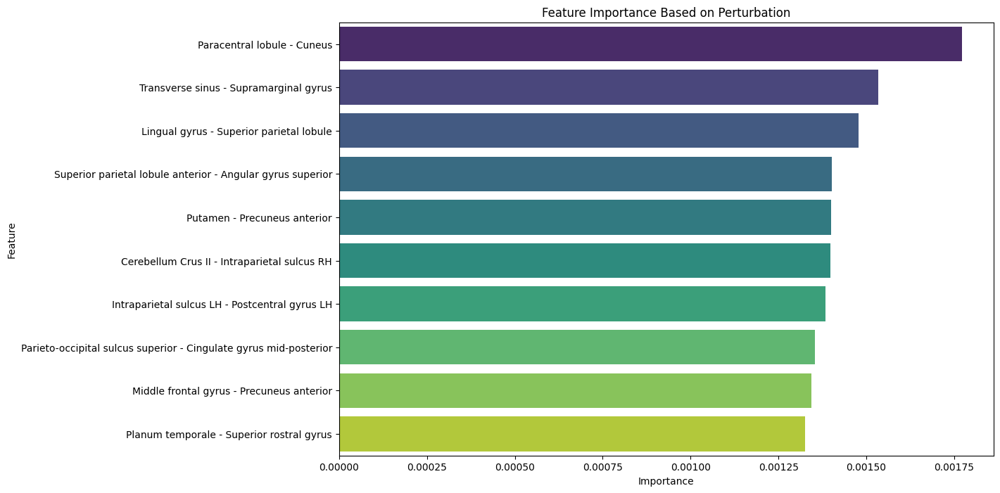

In [31]:
# Optional: Visualize the feature importance
plt.figure(figsize=(12, 8))
sns.barplot(data=perturbation_df.head(10), x="Importance", y="Feature Name", palette="viridis")
plt.title("Feature Importance Based on Perturbation")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()

## Beta Rank

In [32]:
# Display the feature importance
perturbation_df

,Feature Index,Importance,Feature Name
0,1382,0.001773,Paracentral lobule - Cuneus
1,611,0.001534,Transverse sinus - Supramarginal gyrus
2,1973,0.001478,Lingual gyrus - Superior parietal lobule
3,1523,0.001402,Superior parietal lobule anterior - Angular gy...
4,1265,0.001400,Putamen - Precuneus anterior
...,...,...,...
2011,207,0.000082,Cingulate cortex posterior - Putamen
2012,173,0.000080,Calcarine cortex posterior - Middle frontal gyrus
2013,1726,0.000077,Precentral gyrus superior - Postcentral gyrus LH
2014,1078,0.000075,Cerebellum I-V - Inferior occipital gyrus


In [33]:
# Wrap the model to ensure 2D output for SHAP
class ModelWrapper(nn.Module):
    def __init__(self, model):
        super(ModelWrapper, self).__init__()
        self.model = model

    def forward(self, roi_data, age):
        output = self.model(roi_data, age)
        return output.unsqueeze(1)  # Ensures output shape is (batch_size, 1)

# Create a wrapped version of the final model for SHAP explanations
wrapped_model = ModelWrapper(model)
wrapped_model.eval()


ModelWrapper(
  (model): CrossAttentionTransformer(
    (age_mlp): Sequential(
      (0): Linear(in_features=1, out_features=252, bias=True)
      (1): GELU(approximate='none')
      (2): Dropout(p=0.14275996283112669, inplace=False)
      (3): Linear(in_features=252, out_features=252, bias=True)
    )
    (gender_embed): Embedding(2, 252)
    (roi_encoder): Sequential(
      (0): Linear(in_features=2016, out_features=252, bias=True)
      (1): GELU(approximate='none')
      (2): LayerNorm((252,), eps=1e-05, elementwise_affine=True)
      (3): Dropout(p=0.14275996283112669, inplace=False)
      (4): Linear(in_features=252, out_features=252, bias=True)
    )
    (cross_attention): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=252, out_features=252, bias=True)
    )
    (transformer_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=252, out_features=252, bias=True)
  

### Visualize Regions of Interest

In [34]:
difumo_labels = difumo.labels

marker_labels = difumo_labels['difumo_names'].tolist() 



# grab center coordinates for probabilistic atlas

coords = plotting.find_probabilistic_atlas_cut_coords(

    maps_img=difumo.maps)

**Functions**

In [35]:
# Import Delaunay for triangulation

from scipy.spatial import Delaunay  



def pink_crystal_connectome(df, coords, marker_labels, cmap_markers='viridis', cmap_edges='Paired'):

    """

    Visualizes a connectome on a fixed 3D surface using Plotly.

    

    Parameters:

    - df: DataFrame containing correlations between markers.

    - coords: Array of coordinates for the markers.

    - marker_labels: Labels for the markers.

    - cmap_markers: Colormap for the marker colors.

    - cmap_edges: Colormap for the edge colors.

    """



    vertices = coords  # Use the given coordinates for the surface



    # Create a Plotly figure

    fig = go.Figure()



    # Normalize correlations for color mapping

    norm = colors.Normalize(vmin=df['Importance'].min(), vmax=df['Importance'].max())

    cmap_markers = plt.colormaps[cmap_markers]

    cmap_edges = plt.colormaps[cmap_edges]



    # Triangulate the surface mesh using Delaunay triangulation

    if vertices.shape[0] >= 3:  # Ensure we have enough points to form a surface

        tri = Delaunay(vertices[:, :2])  # Use only the x and y coordinates for triangulation



        fig.add_trace(go.Mesh3d(

            x=vertices[:, 0],

            y=vertices[:, 1],

            z=vertices[:, 2],

            color='lightcoral',  # Light color for the surface

            opacity=0.05,  # Adjust opacity for visibility (lower for more transparency)

            i=tri.simplices[:, 0],

            j=tri.simplices[:, 1],

            k=tri.simplices[:, 2],

            name='Brain Surface',  # Name for legend

            showlegend=True  # Show in legend

        ))



    # Ensure marker_labels is a list

    if isinstance(marker_labels, pd.Index):

        marker_labels = marker_labels.tolist()



    # Extract unique markers from the top rows

    unique_markers = pd.unique(df[['Marker1', 'Marker2']].values.ravel('K'))



    # Filter marker labels and coordinates to only include those in unique_markers

    filtered_indices = [i for i, label in enumerate(marker_labels) if label in unique_markers]

    filtered_coords = coords[filtered_indices]

    filtered_labels = [marker_labels[i] for i in filtered_indices]



    # Add nodes to the plot

    fig.add_trace(go.Scatter3d(

        x=filtered_coords[:, 0],

        y=filtered_coords[:, 1],

        z=filtered_coords[:, 2],

        mode='markers+text',

        marker=dict(size=8, color=[colors.to_hex(cmap_markers(norm(c))) for c in df['Importance']]),

        text=filtered_labels,

        textfont=dict(color='black', size=13, family="Arial"),  # Changed text color to black

        textposition='middle right',

        name='Markers'

    ))



    # Add edges to the plot

    for i, row in df.iterrows():

        marker1 = row['Marker1']

        marker2 = row['Marker2']

        correlation = row['Importance']



        marker1_idx = filtered_labels.index(marker1)

        marker2_idx = filtered_labels.index(marker2)



        fig.add_trace(go.Scatter3d(

            x=[filtered_coords[marker1_idx, 0], filtered_coords[marker2_idx, 0]],

            y=[filtered_coords[marker1_idx, 1], filtered_coords[marker2_idx, 1]],

            z=[filtered_coords[marker1_idx, 2], filtered_coords[marker2_idx, 2]],

            mode='lines',

            line=dict(color=colors.to_hex(cmap_edges(norm(correlation))), width=3),

            name=f"{marker1} - {marker2} ({correlation:.2f})"

        ))



    # Update layout

    fig.update_layout(

        title=dict(

            text='',

            x=0.5,

            y=0.95,

            font=dict(size=22, color='navy', family="Roboto", weight='bold')  # Changed title color to navy blue

        ),

        paper_bgcolor='white',  # Changed background to white

        plot_bgcolor='white',   # Changed plot background to white

        scene=dict(

            xaxis=dict(

                title=dict(text='', font=dict(size=18, color='navy')),  # Changed axes title color to navy

                showbackground=False,

                showgrid=False,  # Disable grid

                showline=False,

                linecolor='navy',  # Change axis line color to navy

                showticklabels=False,

                zeroline=False

            ),

            yaxis=dict(

                title=dict(text='', font=dict(size=18, color='navy')),  # Changed axes title color to navy

                showbackground=False,

                showgrid=False,  # Disable grid

                showline=False,

                linecolor='navy',  # Change axis line color to navy

                showticklabels=False,

                zeroline=False

            ),

            zaxis=dict(

                title=dict(text='', font=dict(size=18, color='navy')),  # Changed axes title color to navy

                showbackground=False,

                showgrid=False,  # Disable grid

                showline=False,

                linecolor='navy',  # Change axis line color to navy

                showticklabels=False,

                zeroline=False

            )

        ),

        margin=dict(

            l=20,

            r=20,

            b=20,

            t=20

        ),

        width=800,

        height=600,

        showlegend=True,

        legend=dict(

            x=0.0,

            y=-0.2,

            font=dict(size=10, color='navy', family="Arial"),  # Changed legend text color to navy

            bgcolor='rgba(255, 255, 255, 0)',  # Changed legend background to transparent

        )

    )

    

    if fig:

        fig.write_html('connectome_plot.html')

        print("Plot successfully saved as 'connectome_plot.html'")

    else:

        print("No figure returned.")

        

    # Show the plot

    fig.show()

In [36]:
def roi_map(df):
    """
    Maps the ROI feature names to markers (Marker1 and Marker2) and returns the updated DataFrame.
    
    Args:
        df: A DataFrame containing 'Feature' (or 'Feature Name') and 'Importance' columns.
        
    Returns:
        df: Updated DataFrame with 'Marker1' and 'Marker2' columns and 'Importance' scores.
    """
    
    # Ensure 'Feature' and 'Importance' columns exist
    if 'Feature' not in df.columns and 'Feature Name' not in df.columns:
        raise ValueError("Input DataFrame must contain 'Feature' or 'Feature Name' columns.")
    if 'Importance' not in df.columns:
        raise ValueError("Input DataFrame must contain 'Importance' column.")
    
    # Use 'Feature' or 'Feature Name' depending on the available column
    feature_column = 'Feature' if 'Feature' in df.columns else 'Feature Name'
    
    # Split the 'Feature' column into two new columns: 'Marker1' and 'Marker2'
    df[['Marker1', 'Marker2']] = df[feature_column].str.split(' - ', n=1, expand=True)
    
    # Drop the original 'Feature' column
    df = df.drop(columns=[feature_column])
    
    return df

# Example usage:
# Assuming perturbation_df contains the 'Feature' and 'Importance' columns
ft_importance = roi_map(perturbation_df)
ft_importance.head()


,Feature Index,Importance,Marker1,Marker2
0,1382,0.001773,Paracentral lobule,Cuneus
1,611,0.001534,Transverse sinus,Supramarginal gyrus
2,1973,0.001478,Lingual gyrus,Superior parietal lobule
3,1523,0.001402,Superior parietal lobule anterior,Angular gyrus superior
4,1265,0.001400,Putamen,Precuneus anterior


**Crystal Connectome**

In [37]:
pink_crystal_connectome(ft_importance.head(3), coords, marker_labels, cmap_markers='viridis', cmap_edges='Paired')

Plot successfully saved as 'connectome_plot.html'
